<a href="https://colab.research.google.com/github/dyahrosita/Project/blob/main/Project_June_2021_JACOB_JTI_Dashboard.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving JACOB DATA CLEAN WEEK_1_10-05-2021.xlsx to JACOB DATA CLEAN WEEK_1_10-05-2021.xlsx


In [ ]:
%matplotlib inline

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn import preprocessing
import urllib
import cv2

from google.colab.patches import cv2_imshow

pd.options.display.float_format = '{:,.2f}'.format
def format_float(value):
    return f'{value:,.2f}'
pd.options.display.float_format = format_float

In [ ]:
df = pd.read_excel([*uploaded][0], 'Data')

In [ ]:
# MEnambahkan kolom Sales dalam Rupiah
df['Sales IDR'] = df['Sales'] * df['RSP/Price']
df.head()

,Country Id,Country Name,Area,Store Type,Concatenate,Auditor Id,Resource Name,SMS Id,Instruction Id,Category Id,Category Name,Module Name,Entity Id,Bar Code,Product Description,Brand,Visit Date,Audit Status,Original Fact Value,Cluster Id,RBP,RSP/Price,Shop/Front Stock,Other Stock,Direct Purchase(Pur1),Missing invoice(Pur3),Missing Stock,Sales,Sales IDR
0,360,INDONESIA,KUPANG,WARUNG MEDIUM,KUPANG WARUNG MEDIUM,797341,Margharet Buky,1604825,121809982,8,Cigarette,Cigarette,80130,8990153171011,153 Satu Lima Tiga Lista Kumala Soft Plain 12 ...,153 12,03-Mei-2021,INITIAL AUDIT,(blank),742047,8000,9500,33.00,nan,nan,40.00,nan,7,66500
1,360,INDONESIA,KUPANG,WARUNG MEDIUM,KUPANG WARUNG MEDIUM,797341,Margharet Buky,1604829,121810011,8,Cigarette,Cigarette,80130,8990153171011,153 Satu Lima Tiga Lista Kumala Soft Plain 12 ...,153 12,03-Mei-2021,INITIAL AUDIT,(blank),742047,9000,10000,52.00,nan,nan,100.00,nan,48,480000
2,360,INDONESIA,KUPANG,WARUNG MEDIUM,KUPANG WARUNG MEDIUM,797341,Margharet Buky,1605521,121810003,8,Cigarette,Cigarette,80130,8990153171011,153 Satu Lima Tiga Lista Kumala Soft Plain 12 ...,153 12,03-Mei-2021,INITIAL AUDIT,(blank),742047,9000,10000,15.00,nan,nan,60.00,nan,45,450000
3,360,INDONESIA,KUPANG,WARUNG MEDIUM,KUPANG WARUNG MEDIUM,797341,Margharet Buky,1605529,121810001,8,Cigarette,Cigarette,80130,8990153171011,153 Satu Lima Tiga Lista Kumala Soft Plain 12 ...,153 12,03-Mei-2021,INITIAL AUDIT,(blank),742047,8750,10000,15.00,nan,nan,40.00,nan,25,250000
4,360,INDONESIA,KUPANG,WARUNG MEDIUM,KUPANG WARUNG MEDIUM,797341,Margharet Buky,1605540,121809987,8,Cigarette,Cigarette,80130,8990153171011,153 Satu Lima Tiga Lista Kumala Soft Plain 12 ...,153 12,03-Mei-2021,INITIAL AUDIT,(blank),742047,9000,10000,23.00,nan,nan,40.00,nan,17,170000


In [ ]:
#Cek apakah ada harga jual yang < dari haga beli ?
df[df['RSP/Price'] < df['RBP']]

,Country Id,Country Name,Area,Store Type,Concatenate,Auditor Id,Resource Name,SMS Id,Instruction Id,Category Id,Category Name,Module Name,Entity Id,Bar Code,Product Description,Brand,Visit Date,Audit Status,Original Fact Value,Cluster Id,RBP,RSP/Price,Shop/Front Stock,Other Stock,Direct Purchase(Pur1),Missing invoice(Pur3),Missing Stock,Sales,Sales IDR


Tidak ada harga Jual yang < dari harga belinya

In [ ]:
# Cek sales per toko
pd.pivot_table(df, values=['Sales IDR','Sales'], index=['SMS Id','Area'], aggfunc='sum').sort_values('Sales IDR',ascending=False)

,,Sales,Sales IDR
SMS Id,Area,,
1604609,MADIUN,5037,48410000
1604689,MADIUN,546,7092000
1605350,MADIUN,520,6450000
1605414,MADIUN,540,5992500
1605026,PALEMBANG,414,5620000
...,...,...,...
1604621,MADIUN,0,0
1604715,MADIUN,0,0
1604938,LAMPUNG,0,0


### Terdapat sales yang sangat besar, jauh dari sales toko lainnya (Store ID: 1604609, Area: MADIUN) Rp 48,410,000

In [ ]:
# Drop store dengan penjualan yang terlalu besar
df = df.drop(df[df['SMS Id']==1604609].index)

pd.pivot_table(df, values=['Sales IDR','Sales'], index=['SMS Id','Area'], aggfunc='sum').sort_values('Sales IDR',ascending=False)


,,Sales,Sales IDR
SMS Id,Area,,
1604689,MADIUN,546,7092000
1605350,MADIUN,520,6450000
1605414,MADIUN,540,5992500
1605026,PALEMBANG,414,5620000
1604477,KARAWANG,448,5422000
...,...,...,...
1605157,PALEMBANG,0,0
1605161,PALEMBANG,0,0
1604715,MADIUN,0,0


In [ ]:
# Cek jumlah unique toko per Cabang
store_per_area = df[['SMS Id','Area']].groupby('Area').nunique()
store_per_area

,SMS Id
Area,
KARAWANG,75
KUPANG,81
LAMPUNG,84
MADIUN,82
PALEMBANG,80


In [ ]:
# Cek jumlah unique toko per Store Type di setiap Area
store_per_type = df.pivot_table(values='SMS Id', index=['Area','Store Type'], aggfunc=lambda x: len(x.unique()))
store_per_type

SMS Id
Area      Store Type           
KARAWANG  WARUNG LARGE       16
          WARUNG MEDIUM      56
          WARUNG SMALL        3
KUPANG    WARUNG LARGE       19
          WARUNG MEDIUM      36
          WARUNG SMALL       26
LAMPUNG   WARUNG LARGE       29
          WARUNG MEDIUM      45
          WARUNG SMALL       10
MADIUN    WARUNG LARGE       32
          WARUNG MEDIUM      32
          WARUNG SMALL       18
PALEMBANG WARUNG LARGE       23
          WARUNG MEDIUM      49
          WARUNG SMALL        8

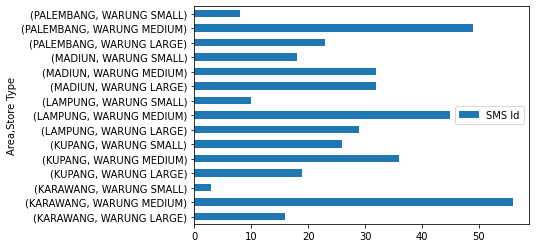

In [ ]:
store_per_type.plot(kind='barh')
plt.show()

- untuk Area PALEMBANG, KARAWANG, dan LAMPUNG, jumlah WARUNG SMALL dibawah/= 10, lebih di dominasi oleh WARUNG MEDIUM.



In [ ]:
# Cek rata2 penjualan per Area
df.groupby('Product Description')
sales_per_area = df.pivot_table(values=['Sales','Sales IDR'], index=['Area','Store Type'], aggfunc='sum')
rata2_sales_area = sales_per_area / store_per_type.values
rata2_sales_area.reset_index(inplace=True)
rata2_sales_area

,Area,Store Type,Sales,Sales IDR
0,KARAWANG,WARUNG LARGE,192.94,"2,574,625.00"
1,KARAWANG,WARUNG MEDIUM,94.62,"1,310,732.14"
2,KARAWANG,WARUNG SMALL,147.33,"2,091,166.67"
3,KUPANG,WARUNG LARGE,27.00,"321,473.68"
4,KUPANG,WARUNG MEDIUM,31.75,"341,416.67"
5,KUPANG,WARUNG SMALL,25.92,"281,153.85"
6,LAMPUNG,WARUNG LARGE,26.00,"371,241.38"
7,LAMPUNG,WARUNG MEDIUM,11.18,"153,777.78"
8,LAMPUNG,WARUNG SMALL,5.60,"77,000.00"
9,MADIUN,WARUNG LARGE,91.28,"1,112,593.75"


### !!! Rata-rata penjualan WARUNG MEDIUM di KARAWANG < dari rata2 penjualan WARUNG SMALL nya

Mungkin karena sample nya hanya 3 dan kebetulan toko2 tsb yg banyak jualannya

Dan data Sales toko juga masih banyak yang 0(nol) jadi belum terlihat nilai yg sebenarnya.

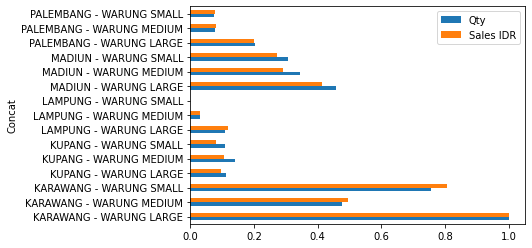

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
df_norm = pd.DataFrame(scaler.fit_transform(rata2_sales_area[['Sales','Sales IDR']]), columns=['Qty','Sales IDR'])

norm_sales_area = pd.concat([rata2_sales_area.iloc[:,0:2],df_norm], axis=1)
norm_sales_area['Concat'] = norm_sales_area['Area'] + " - " + norm_sales_area['Store Type']
norm_sales_area.plot(kind='barh', x='Concat')

In [ ]:
# Cek rata2 harga rokok di masing2 Area
cig_per_area = pd.pivot_table(df, values=['RBP','RSP/Price'], index=['Area'])
cig_per_area['Selisih'] = cig_per_area['RSP/Price'] - cig_per_area['RBP']
cig_per_area.sort_values('Selisih',ascending=False)

,RBP,RSP/Price,Selisih
Area,,,
KARAWANG,"11,830.74","13,541.16","1,710.42"
LAMPUNG,"11,975.00","13,303.51","1,328.51"
PALEMBANG,"12,068.71","13,282.93","1,214.22"
KUPANG,"10,544.34","11,712.20","1,167.85"
MADIUN,"11,440.04","12,558.47","1,118.43"


### Terlihat bahwa memang rata2 rokok di KARAWANG dijual dengan selisih yang lebih tinggi dari harga belinya dibandingkan dengan Area2 lainnya

### Dan di MADIUN harganya relatif lebih murah daripada di Area lainnya

In [ ]:
# Cek rata2 harga rokok per SKU di masing2 Area
cig_per_SKU = pd.pivot_table(df, values=['RBP','RSP/Price'], index=['Product Description', 'Area'])
cig_per_SKU['Selisih'] = cig_per_SKU['RSP/Price'] - cig_per_SKU['RBP']
cig_per_SKU

RBP  ...  Selisih
Product Description                                Area                 ...         
153 Satu Lima Tiga Lista Kumala Soft Plain 12 S... KUPANG     8,835.71  ... 1,248.70
Apache Brown Box Plain 12 Stc (Sktb)               KARAWANG   7,940.00  ... 1,260.00
                                                   LAMPUNG    8,000.00  ... 1,181.82
                                                   PALEMBANG  8,238.64  ... 1,215.91
Apache Brown Box Plain 20 Stc (Sktb)               LAMPUNG   14,280.00  ... 1,220.00
Apache Brown Soft Plain 12 Stc (Sktb)              LAMPUNG    8,535.71  ... 1,250.00
                                                   MADIUN     8,875.32  ... 1,101.30
                                                   PALEMBANG  8,788.89  ... 1,266.67
Bentoel SJT Box Plain 12 Stc (Sktnb)               KARAWANG   8,500.00  ... 1,500.00
Bulls Box Plain 12 Stc (Sktb)                      KUPANG     5,386.11  ... 1,030.56
Dados Brown Soft Plain 12 Stc (Sktb)               MADIUN     5,250.00  ... 1,000.00
                                                   PALEMBANG  5,541.67  ...   833.33
Divo Box Plain 12 Stc (Sktb)                       KARAWANG   7,788.75  ... 1,461.25
Djarum 76 Brown Box Plain 12 Stc (Sktb)            MADIUN    12,719.33  ... 1,147.33
Djarum Coklat Soft Plain 12 Stc (Sktb)             KARAWANG  12,883.85  ... 1,542.31
Djarum Istimewa Soft Coklat Plain 12 Stc (Sktb)    PALEMBANG 12,104.84  ... 1,145.16
Dji Sam Soe Edisi Khusus Soft Plain 12 Stc (Sktb)  KARAWANG  16,300.00  ... 1,825.00
                                                   KUPANG    16,775.00  ... 1,300.00
                                                   LAMPUNG   16,105.00  ... 1,720.00
                                                   MADIUN    16,024.17  ... 1,192.50
                                                   PALEMBANG 16,128.85  ... 1,486.54
Dji Sam Soe Soft Plain 12 Stc (Sktb)               KARAWANG  15,908.96  ... 2,265.67
                                                   KUPANG    16,866.98  ... 1,156.28
                                                   LAMPUNG   16,119.30  ... 1,757.89
                                                   MADIUN    16,133.33  ... 1,255.56
                                                   PALEMBANG 16,081.25  ... 1,393.75
Grendel Utama Yellow Box Plain 12 Stc (Sktb)       MADIUN     6,200.00  ...   800.00
Gudang Baru King Size Red Box Plain 12 Stc (Sktb)  PALEMBANG 11,500.00  ... 2,500.00
Gudang Garam Djaja Soft Kspl 12 Stc (Sktb)         LAMPUNG   11,638.31  ... 1,355.19
Gudang Garam Red Box Kspl 12 Stc (Sktb)            KUPANG    12,415.38  ... 1,174.36
Gudang Garam Red Soft Kspl 12 Stc (Sktb)           KARAWANG  12,473.88  ... 1,809.70
                                                   LAMPUNG   12,573.08  ... 1,244.23
                                                   PALEMBANG 12,050.00  ... 1,257.02
Gudang Garam Taman Sriwedari Soft Kspl 12 Stc (... KARAWANG  10,840.00  ... 1,560.00
                                                   LAMPUNG   11,198.98  ... 1,127.55
Kedai Kopi Yellow Soft Plain 12 Stc (Sktb)         LAMPUNG    8,874.39  ... 1,101.22
Marlboro Advance Box Filter 12 Stc (Skmb) (P)      KUPANG    16,166.67  ... 1,000.00
Marlboro Box Filter 12 Stc (Skmb)                  KUPANG     8,102.88  ... 1,262.50
Menara Special Kuning Box Plain 12 Stc (Sktb)      KUPANG     6,680.26  ... 1,056.58
Minak Djinggo Kuning Soft Plain 10 Stc (Sktb)      KARAWANG   7,929.25  ... 1,278.30
Nalami Na Classic Brown Soft Plain 12 Stc (Sktb)   MADIUN     5,466.67  ... 1,033.33
Panamas 1 Soft Plain 12 Stc (Sktb)                 PALEMBANG 11,983.33  ... 1,079.17
Sampoerna 'A' Hijau Box Plain 12 Stc (Sktb)        KARAWANG  11,740.15  ... 1,755.30
                                                   KUPANG    11,913.79  ... 1,120.69
                                                   LAMPUNG   12,086.36  ... 1,241.05
                                                   MADIUN    11,700.00  

In [ ]:
cig_per_SKU.sort_values('Selisih', ascending=False).head()

,,RBP,RSP/Price,Selisih
Product Description,Area,,,
Gudang Baru King Size Red Box Plain 12 Stc (Sktb),PALEMBANG,"11,500.00","14,000.00","2,500.00"
Dji Sam Soe Soft Plain 12 Stc (Sktb),KARAWANG,"15,908.96","18,174.63","2,265.67"
Dji Sam Soe Edisi Khusus Soft Plain 12 Stc (Sktb),KARAWANG,"16,300.00","18,125.00","1,825.00"
Gudang Garam Red Soft Kspl 12 Stc (Sktb),KARAWANG,"12,473.88","14,283.58","1,809.70"
Dji Sam Soe Soft Plain 12 Stc (Sktb),LAMPUNG,"16,119.30","17,877.19","1,757.89"


### Ada 2 brand yang selisih RBP dan RSP nya lebih dari Rp 2,000
  1. Dji Sam Soe Soft Plain 12 Stc (Sktb) - KARAWANG (Rp 2265)

  2. Gudang Baru King Size Red Box Plain 12 Stc (Sktb) - PALEMBANG (Rp 2500) [merupakan satu2nya Area yg menjual brand tsb]

In [ ]:
#Cek jumlah product/ item brand yang dijual masing2 toko
item_per_store = pd.pivot_table(df, values='Product Description', index=['SMS Id','Area'], aggfunc='count').sort_values('Product Description',ascending=False)
store_with_1_item = item_per_store[item_per_store['Product Description'] == 1]
store_with_1_item.reset_index(inplace=True)
store_code = list(store_with_1_item.iloc[:,0])
store_with_1_item

,SMS Id,Area,Product Description
0,1605475,MADIUN,1
1,1604954,LAMPUNG,1
2,1605110,PALEMBANG,1
3,1605553,KUPANG,1
4,1605571,KUPANG,1
5,1605538,KUPANG,1
6,1605157,PALEMBANG,1
7,1605005,LAMPUNG,1
8,1605377,MADIUN,1


### Cek di Foto Store (jika terlihat) apakah benar Toko2 diatas hanya membawa 1 produk rokok saja?

In [ ]:
foto = pd.read_excel([*uploaded][0], 'Link Foto')
foto['SMS Id'] = foto['RESPONSE_NAME'].copy()
for i in range(foto.shape[0]):
  foto['SMS Id'][i] = foto['RESPONSE_NAME'][i][:7]

foto['SMS Id'] = foto['SMS Id'].astype(int)

urls_ = foto[foto['SMS Id'].isin(store_code)]['Q25. Foto Tampak Dalam Toko']
codes_ = foto[foto['SMS Id'].isin(store_code)]['SMS Id']


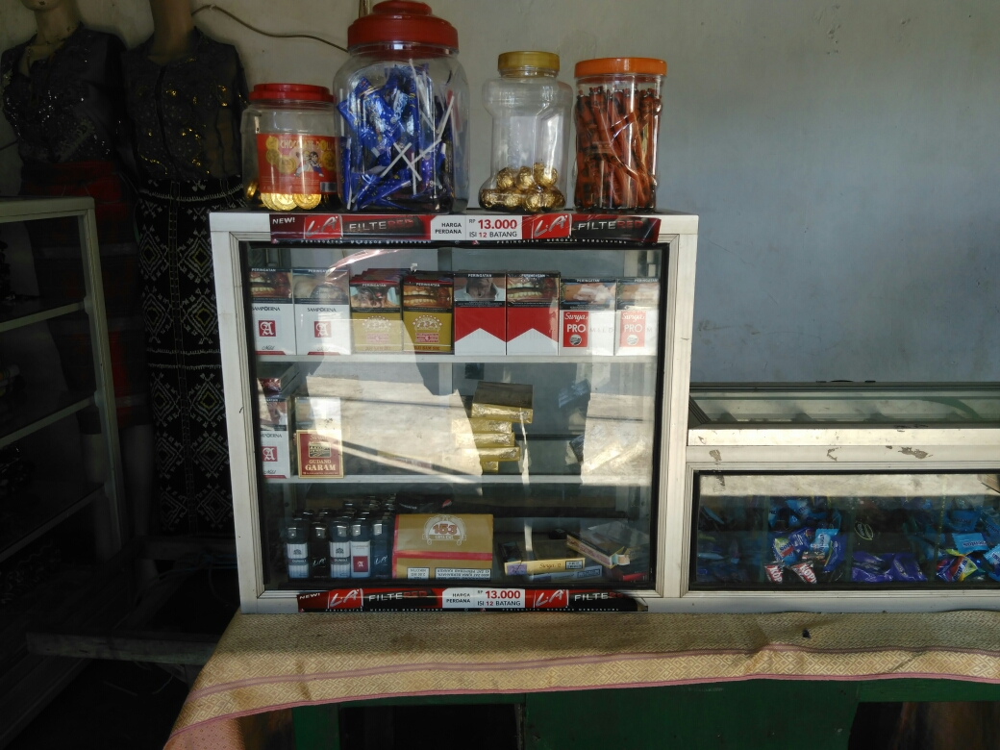

SMS Id :  1605553


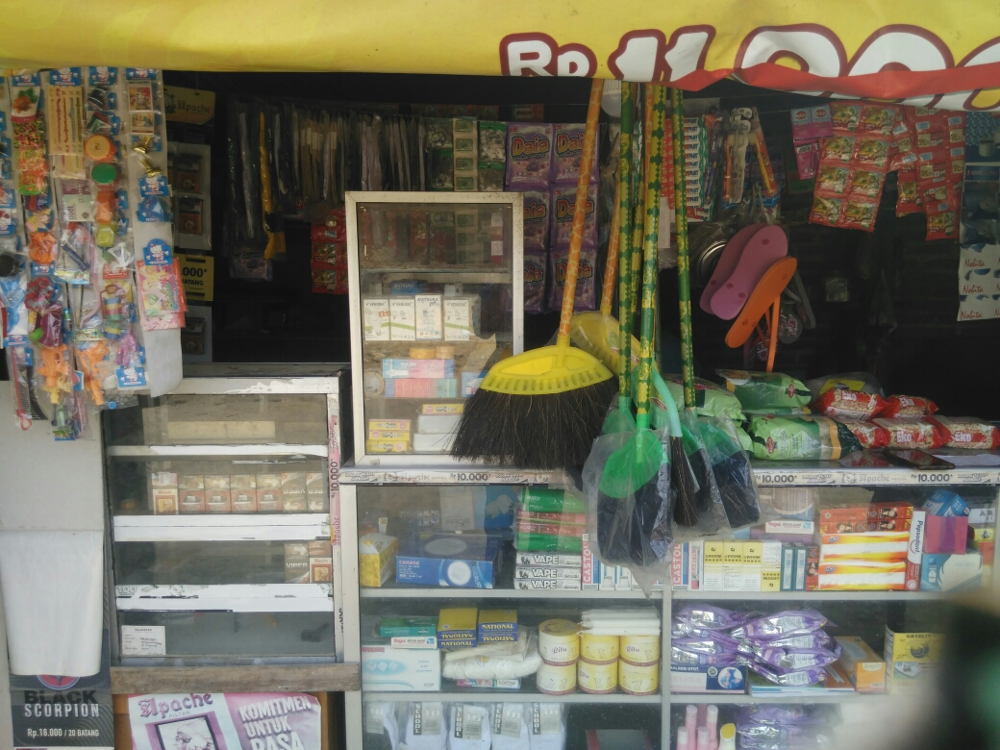

SMS Id :  1605377


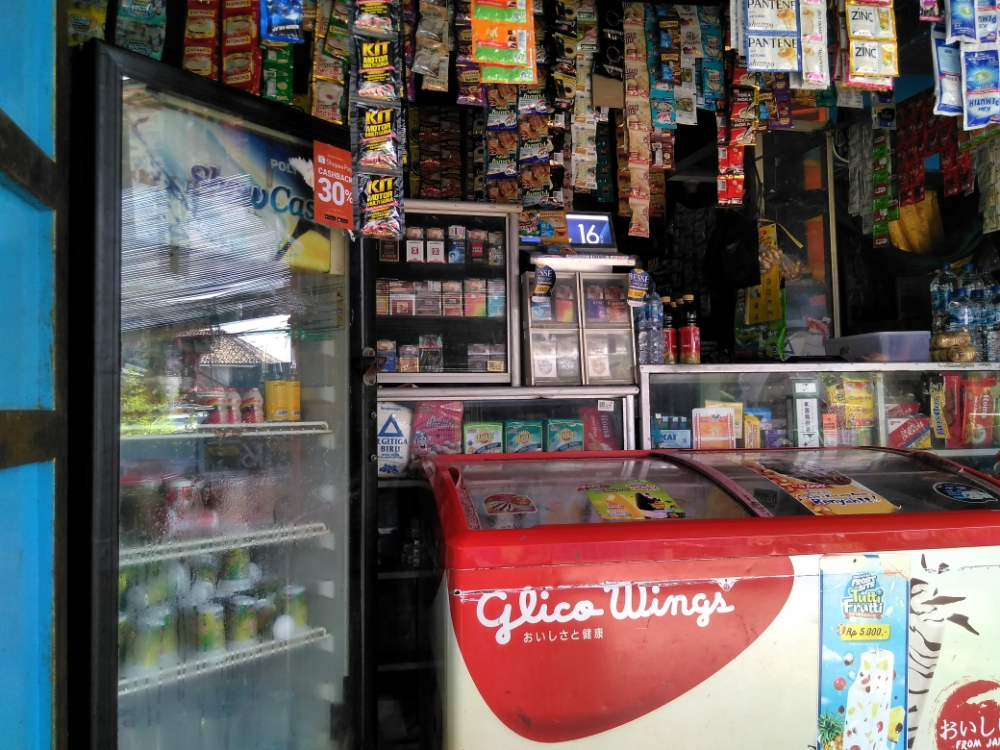

SMS Id :  1605157


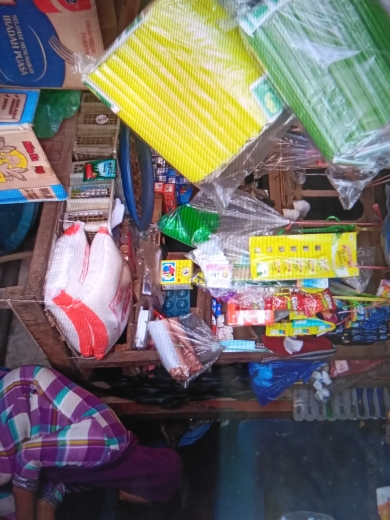

SMS Id :  1605110


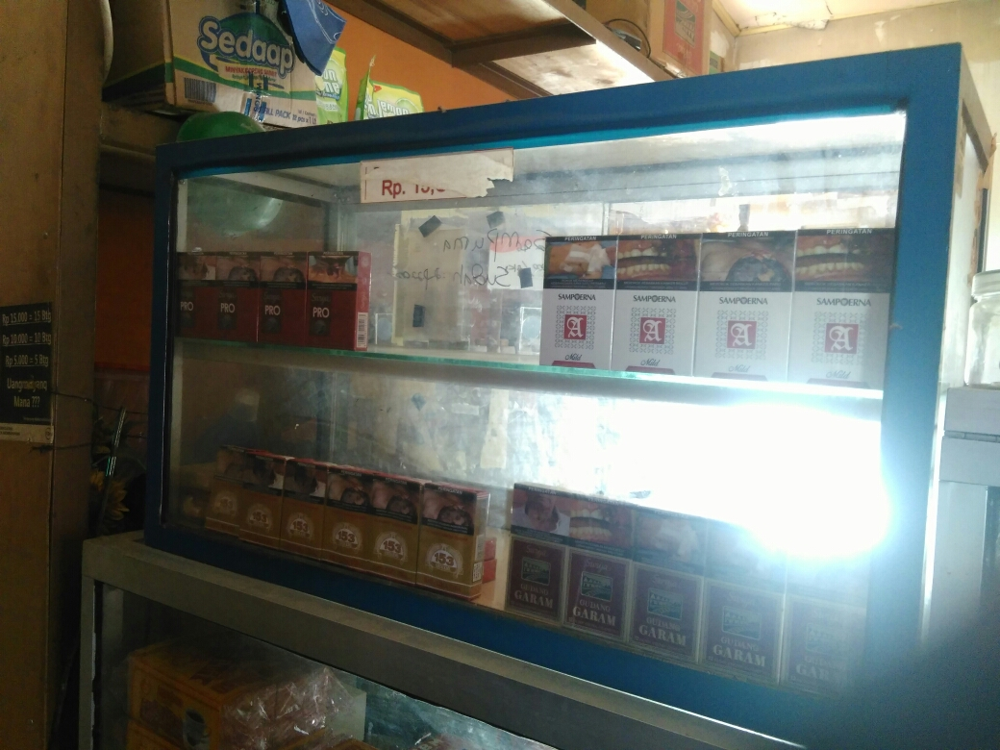

SMS Id :  1605571


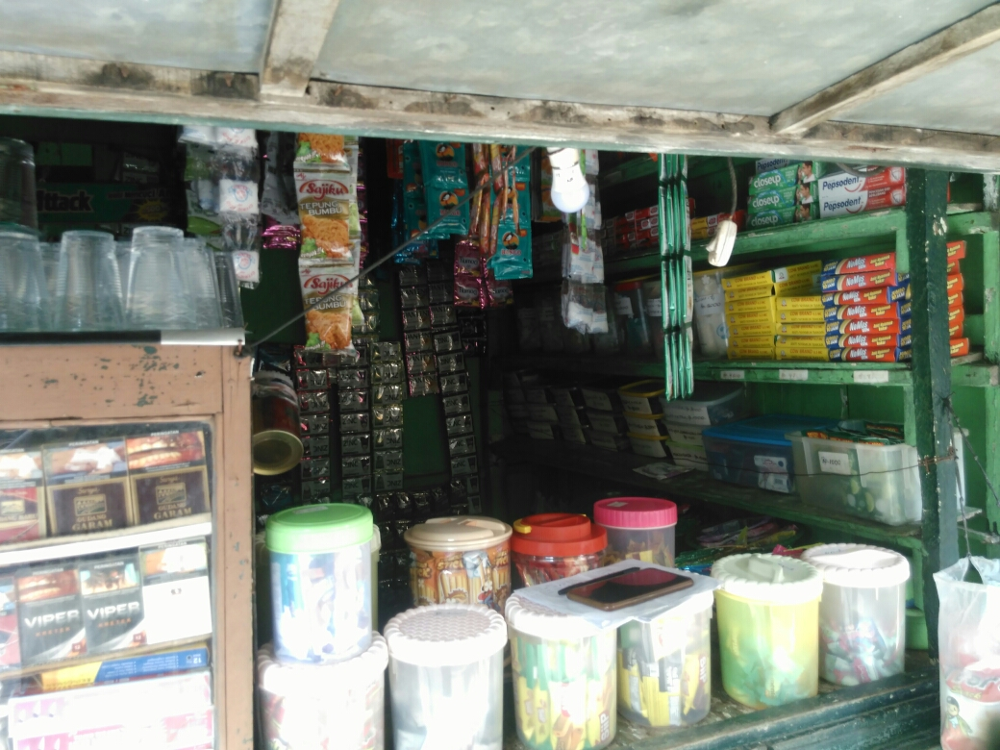

SMS Id :  1605475


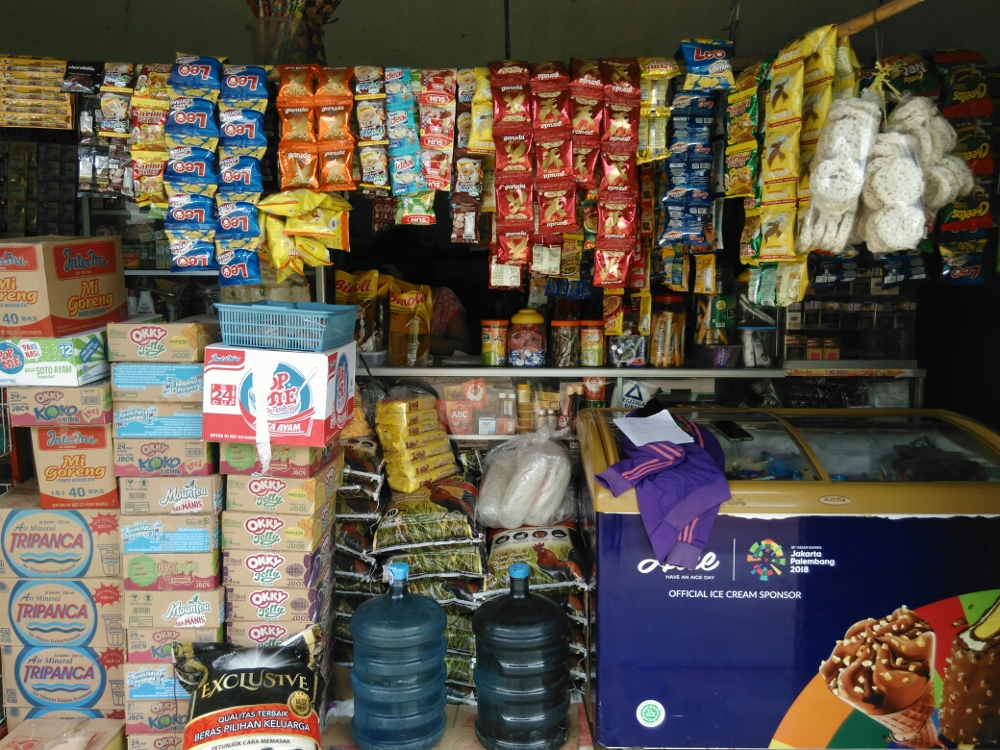

SMS Id :  1605005


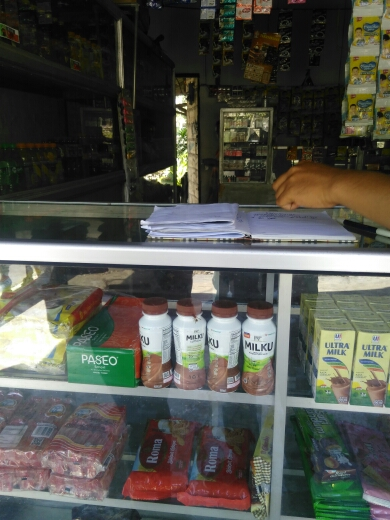

SMS Id :  1605538


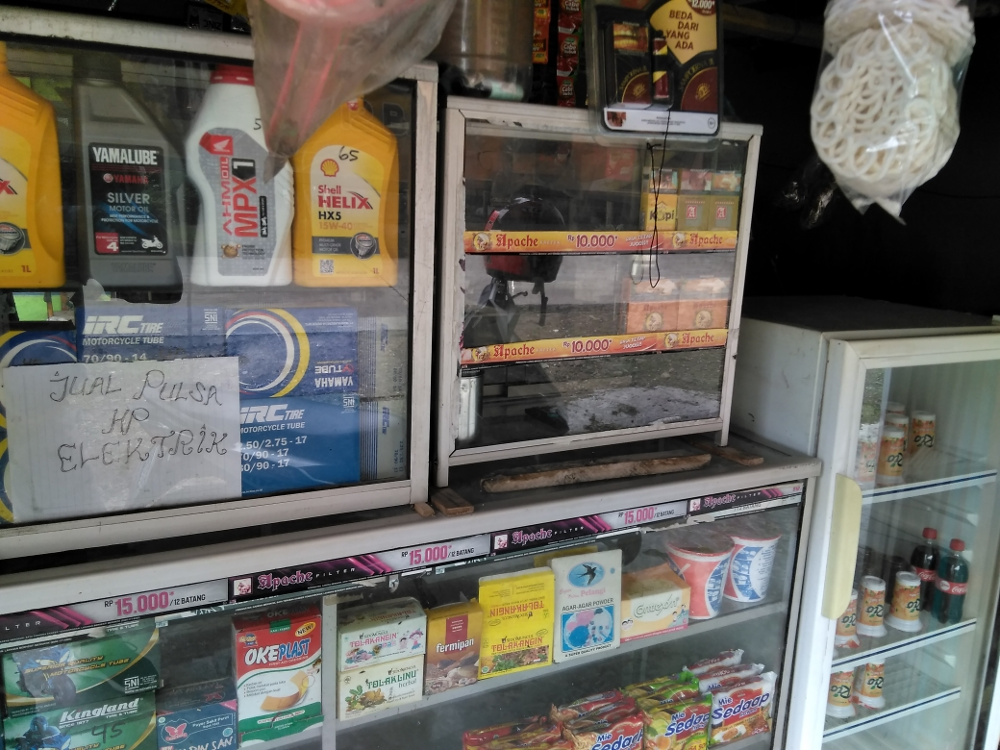

SMS Id :  1604954


In [ ]:
j = 0
for i in urls_:
  if pd.isna(i) :
    j += 1
    continue
  else:
    urllib.request.urlretrieve(i, "sample.jpg")
    img = cv2.imread("sample.jpg", cv2.IMREAD_UNCHANGED)
    cv2_imshow(img)
    print("SMS Id : ",codes_.iloc[j])
    j += 1

Sudah di cek di foto store bahwa ternyata toko2 tersebut membawa lebih dari 1 produk rokok. Rata2 membawa 3-4 produk.

### - Untuk next data sales yang digunakan adalah seperti perhitungan berikut:
  # Sales = stock + purcase - prev. purcase
### - Jika audit dilakuakan kurang/ lebih dari 1 minggu (7 hari) maka sales nya akan dihitung prorate.
### - Jika ada Store yang tutup sementara maka perhitungan juga akan diprorate berdasarkan rata2 data historikal store tsb. Namun jika toko tersebut tutup lebih dari 3 minggu, maka toko tersebut akan di take out dari data dan diganti toko yg lain/ data Area tsb di adjust.
